# Lesson 1 - What's your pet

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from fastai import *
from fastai.vision import *
from fastai.callbacks.hooks import *

In [3]:
bs = 64
# bs = 16   # uncomment this line if you run out of memory even after clicking Kernel->Restart

In [4]:
path = untar_data(URLs.CARS); path

WindowsPath('C:/Users/Tanks/.fastai/data/stanford-cars')

In [5]:
tfms = get_transforms(do_flip=False,flip_vert=False, max_rotate=0,max_lighting=0.3)
data = ImageDataBunch.from_folder(path, valid_pct=0.2, ds_tfms=tfms, size=224)

C:\Users\Tanks\anaconda3\envs\MSCS-FastAI-1\lib\site-packages\fastai\vision\transform.py:247: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\BatchLinearAlgebra.cpp:859.)
  return _solve_func(B,A)[0][:,0]


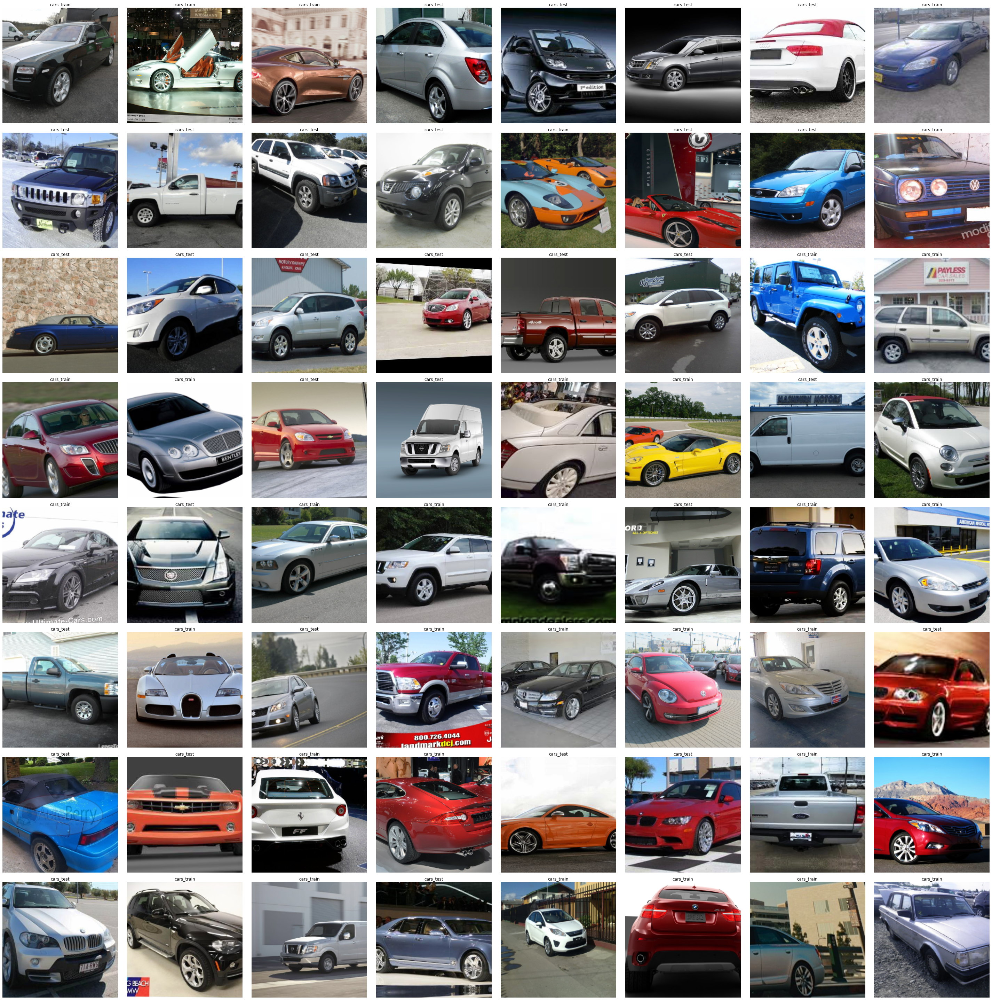

In [6]:
data.show_batch(rows=8, figsize=(40,40))

In [7]:
learn = cnn_learner(data, models.resnet50, metrics=accuracy)
learn.fit_one_cycle(16)

epoch,train_loss,valid_loss,accuracy,time
0,1.198143,0.927802,0.507569,03:02
1,0.853881,0.734693,0.506951,02:58
2,0.740683,0.721012,0.494594,02:58
3,0.742103,0.752786,0.495829,02:59
4,0.752620,0.744838,0.492122,02:58
5,0.739297,0.741350,0.498610,02:56
6,0.727465,0.730097,0.502935,02:45
7,0.720002,0.727870,0.490578,02:41
8,0.707642,0.727482,0.484708,02:42
9,0.702611,0.720353,0.489651,1:02:30


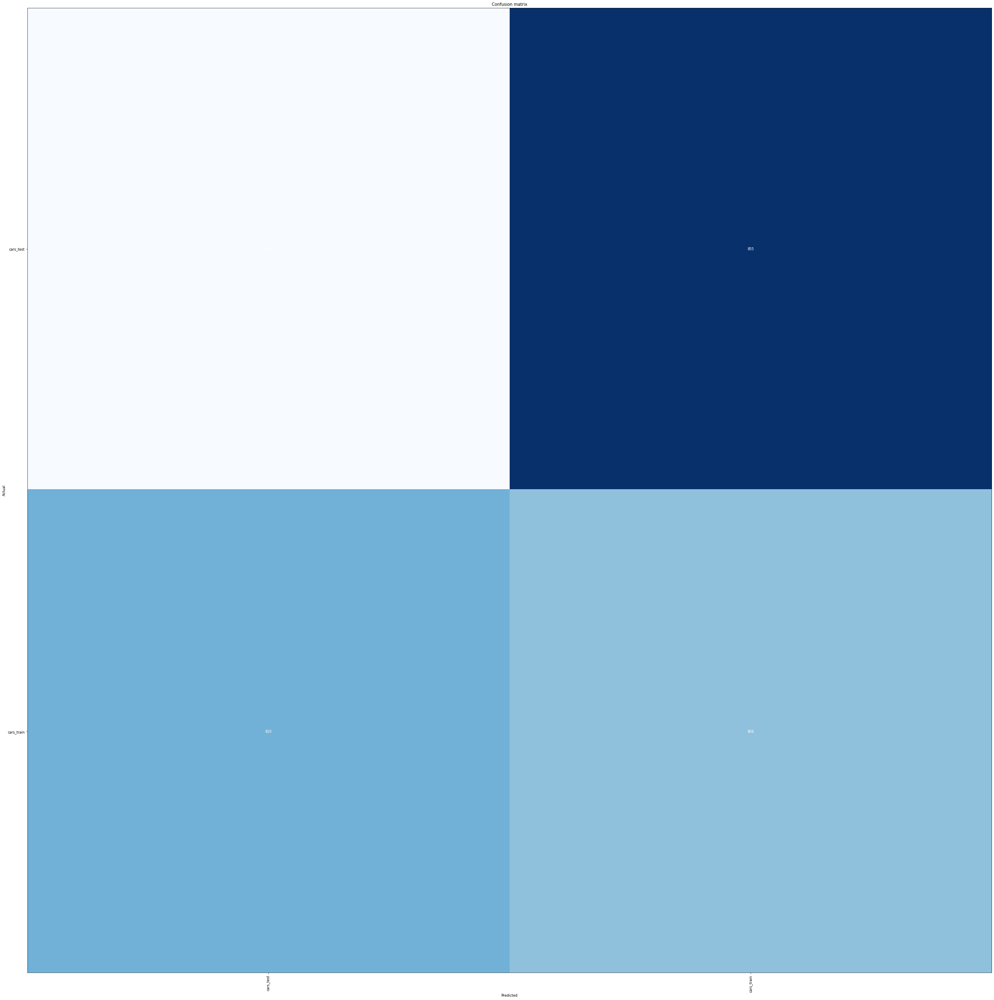

In [8]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(40,40), dpi=60)

In [9]:
interp.most_confused(min_val=2)

[('cars_test', 'cars_train', 855), ('cars_train', 'cars_test', 810)]